In [435]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy.stats import chi2
from impyute.imputation.cs import mice
import statsmodels.api as sm
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn import linear_model
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors, Lipinski, Draw
from mordred import Calculator, descriptors
import joblib
from sklearn.model_selection import KFold

In [436]:
df=pd.read_csv("dopamine_receptor_total.csv")
df.head(5)

,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,NaN,34848,[],CHEMBL872503,Binding affinity towards dopamine transporter ...,B,NaN,NaN,BAO_0000192,BAO_0000221,tissue-based format,NaN,NaN,NaN,CHEMBL1129546,J. Med. Chem.,1996.0,"{'bei': '19.50', 'le': None, 'lle': None, 'sei...",CHEMBL178011,"tri carbonyl methyl (3S,5R)-8-methyl-3-phenyl-...",CHEMBL178011,7.77,0,http://www.openphacts.org/units/Nanomolar,63553,=,1,1,=,NaN,Ki,nM,NaN,17.0,CHEMBL238,Homo sapiens,Dopamine transporter,9606,NaN,NaN,Ki,nM,UO_0000065,NaN,17.0
1,NaN,34849,[],CHEMBL671773,Binding affinity towards dopamine transporter ...,B,NaN,NaN,BAO_0000192,BAO_0000357,single protein format,NaN,NaN,NaN,CHEMBL1129546,J. Med. Chem.,1996.0,"{'bei': '16.69', 'le': None, 'lle': None, 'sei...",CHEMBL178011,"tri carbonyl methyl (3S,5R)-8-methyl-3-phenyl-...",CHEMBL178011,6.65,0,http://www.openphacts.org/units/Nanomolar,63553,=,1,1,=,NaN,Ki,nM,NaN,224.0,CHEMBL238,Homo sapiens,Dopamine transporter,9606,NaN,NaN,Ki,nM,UO_0000065,NaN,224.0
2,NaN,53423,[],CHEMBL872503,Binding affinity towards dopamine transporter ...,B,NaN,NaN,BAO_0000192,BAO_0000221,tissue-based format,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,NaN,NaN,CHEMBL1129546,J. Med. Chem.,1996.0,"{'bei': '28.85', 'le': '0.54', 'lle': '5.05', ...",CHEMBL1790051,NaN,CHEMBL83729,7.48,0,http://www.openphacts.org/units/Nanomolar,63551,=,1,1,=,NaN,Ki,nM,NaN,33.0,CHEMBL238,Homo sapiens,Dopamine transporter,9606,NaN,NaN,Ki,nM,UO_0000065,NaN,33.0
3,NaN,53424,[],CHEMBL671773,Binding affinity towards dopamine transporter ...,B,NaN,NaN,BAO_0000192,BAO_0000357,single protein format,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,NaN,NaN,CHEMBL1129546,J. Med. Chem.,1996.0,"{'bei': '25.07', 'le': '0.47', 'lle': '4.07', ...",CHEMBL1790051,NaN,CHEMBL83729,6.50,0,http://www.openphacts.org/units/Nanomolar,63551,=,1,1,=,NaN,Ki,nM,NaN,314.0,CHEMBL238,Homo sapiens,Dopamine transporter,9606,NaN,NaN,Ki,nM,UO_0000065,NaN,314.0
4,NaN,53425,[],CHEMBL671771,Inhibitory activity against [3H]-Dopamine upta...,B,NaN,NaN,BAO_0000190,BAO_0000221,tissue-based format,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,NaN,NaN,CHEMBL1129546,J. Med. Chem.,1996.0,"{'bei': '24.79', 'le': '0.46', 'lle': '4.00', ...",CHEMBL1790051,NaN,CHEMBL83729,6.43,0,http://www.openphacts.org/units/Nanomolar,63551,=,1,1,=,NaN,IC50,nM,NaN,373.0,CHEMBL238,Homo sapiens,Dopamine transporter,9606,NaN,NaN,IC50,nM,UO_0000065,NaN,373.0


In [437]:
df.shape

(8227, 45)

In [438]:
for col in df.columns:
    print(col)

activity_comment
activity_id
activity_properties
assay_chembl_id
assay_description
assay_type
assay_variant_accession
assay_variant_mutation
bao_endpoint
bao_format
bao_label
canonical_smiles
data_validity_comment
data_validity_description
document_chembl_id
document_journal
document_year
ligand_efficiency
molecule_chembl_id
molecule_pref_name
parent_molecule_chembl_id
pchembl_value
potential_duplicate
qudt_units
record_id
relation
src_id
standard_flag
standard_relation
standard_text_value
standard_type
standard_units
standard_upper_value
standard_value
target_chembl_id
target_organism
target_pref_name
target_tax_id
text_value
toid
type
units
uo_units
upper_value
value


In [439]:
#Unique value counts in standard_type
df.standard_type.value_counts()

IC50                                                   3402
Ki                                                     3072
Inhibition                                             1258
Activity                                                186
Ratio                                                    76
pKD                                                      56
EC50                                                     53
Log 1/C                                                  50
Kd                                                       21
% Ctrl                                                   12
% Inhibition of Control Specific Binding (Mean n=2)       9
Displacement                                              6
IC5                                                       4
Ratio Ki                                                  4
pKi                                                       3
Efficacy                                                  2
Ratio IC50                              

In [ ]:
#MISSING DATA PLOT for all the activity classes
missing =data.standard_value.isna().sum()
non_missing = data.standard_value.notnull().sum()


x = ['missing', 'non_missing']
y = [missing, non_missing]

# Setup plot
fig, ax = plt.subplots()

# Make bar plot
p = ax.bar(x, y, color = ['#F8766D', '#00BFC4'], ec = 'black')

ax.set_title('Standard_Value Missing Data', fontsize=14, fontweight='bold', pad=15)
#ax.set_xticklabels(x, fontweight='bold')

ax.set_ylim(0,10000)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Label above bar
for index, data in enumerate(y):
    plt.text(x=index-0.1 , y =data+1000 , s=f"{data}" , fontdict=dict(fontsize=14))

fig.set_size_inches(5,4.5)
plt.show()


In [440]:
#selecting only IC50, Ki, Inhibition and Activity - 4 standard_type classes

data= df[(df['standard_type']=="IC50") | (df['standard_type']=="Ki") | (df['standard_type']=="Inhibition") | (df['standard_type']=="Activity")]
print(data.standard_type.value_counts())
print(data.shape)


IC50          3402
Ki            3072
Inhibition    1258
Activity       186
Name: standard_type, dtype: int64
(7918, 45)


In [441]:
#missing standard values
print("missing in standard_value",data.standard_value.isna().sum())
print("missing in canonical_smiles",data.canonical_smiles.isna().sum())

missing in standard_value 2017
missing in canonical_smiles 99


In [442]:
#Drop the rows with missing canonical smiles - 99 rows
data=data.dropna(subset = ['canonical_smiles'])
data=data.reset_index(drop=True)
print("missing in canonical_smiles",data.canonical_smiles.isna().sum())

missing in canonical_smiles 0


In [443]:
#Select the most important features from data
data = data[['molecule_chembl_id','canonical_smiles','standard_type','standard_value','standard_units']]

In [444]:
data.shape

(7819, 5)

In [ ]:
#Lepinski descriptors


In [445]:
#function for lipinski calculator from. : https://codeocean.com/explore/capsules?query=tag:data-curation
def lipinski(smiles, verbose=False):

    moldata= []
    for elem in smiles:
        mol=Chem.MolFromSmiles(elem) 
        moldata.append(mol)
     
    
    baseData= np.arange(1,1)
    i=0  
    for mol in moldata:        
       
        desc_MolWt = Descriptors.MolWt(mol) #Molecular weight
        desc_HeavyAtomMolWt = Descriptors.HeavyAtomMolWt(mol) #molecular weight of the molecule ignoring hydrogens
        desc_MolLogP = Descriptors.MolLogP(mol) #LogP
        desc_MolMR = Descriptors.MolMR(mol)
        desc_NumHDonors = Lipinski.NumHDonors(mol) #Number of Hydrogen Donors
        desc_NumHAcceptors = Lipinski.NumHAcceptors(mol) #Number of Hydrogen Acceptors
        desc_NumAtoms= mol.GetNumAtoms() #Number of atoms
        desc_GetBonds= mol.GetBonds() #Number of bonds
        desc_cfg = Chem.rdmolops.GetMolFrags(mol, asMols=True) #Chemical function group
        desc_num_aromatic_rings = Descriptors.NumAromaticRings(mol)
        desc_tpsa = Descriptors.TPSA(mol)
        desc_num_rotatable_bonds = Lipinski.NumRotatableBonds(mol)
        
           
        row = np.array([desc_MolWt,desc_HeavyAtomMolWt,
                        desc_MolLogP,desc_MolMR,
                        desc_NumHDonors,
                        desc_NumHAcceptors,desc_NumAtoms,desc_GetBonds,desc_cfg,desc_num_aromatic_rings,
                        desc_tpsa,desc_num_rotatable_bonds])   
    
        if(i==0):
            baseData=row
        else:
            baseData=np.vstack([baseData, row])
        i=i+1      
    
    columnNames=["MW","HeavyAtomMolWt","LogP","MolMR","NumHDonors","NumHAcceptors","NumAtoms","GetBonds","CFG","AR","TPSA","RB"]   
    descriptors = pd.DataFrame(data=baseData,columns=columnNames)
    
    return descriptors


In [446]:
lipinski1 = lipinski(data.canonical_smiles)
lipinski1

/var/folders/t0/mwd450_d17x_24_r5z4fl90m0000gn/T/ipykernel_58023/3035385669.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  row = np.array([desc_MolWt,desc_HeavyAtomMolWt,


,MW,HeavyAtomMolWt,LogP,MolMR,NumHDonors,NumHAcceptors,NumAtoms,GetBonds,CFG,AR,TPSA,RB
0,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3450>...,1,29.54,2
1,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3530>...,1,29.54,2
2,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3680>...,1,29.54,2
3,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf38b0>,)",1,55.84,3
4,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3920>,)",1,55.84,3
5,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3a00>,)",1,55.84,3
6,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3ae0>...,3,96.38,6
7,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3c30>...,3,96.38,6
8,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3d80>...,3,96.38,6
9,435.178,416.026,5.1731,107.3846,2,3,26,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3ed0>,)",2,43.7,3


In [319]:
lipinski1["CFG"]

0       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5380>...
1       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5460>...
2        (<rdkit.Chem.rdchem.Mol object at 0x2a31c55b0>,)
3        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5690>,)
4        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5770>,)
5        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5850>,)
6        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5930>,)
7        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5a10>,)
8        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5af0>,)
9        (<rdkit.Chem.rdchem.Mol object at 0x2a31c5bd0>,)
10       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5cb0>,)
11       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5d90>,)
12       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5e70>,)
13       (<rdkit.Chem.rdchem.Mol object at 0x2a31c5f50>,)
14       (<rdkit.Chem.rdchem.Mol object at 0x2a31c6030>,)
15       (<rdkit.Chem.rdchem.Mol object at 0x2a31c6110>,)
16       (<rdkit.Chem.rdchem.Mol object at 0x2a31c61f0>,)
17       (<rdk

In [472]:
#Combining all to one dataframe
data_all=pd.concat([data,lipinski1], axis=1)

In [473]:
data_all

,molecule_chembl_id,canonical_smiles,standard_type,standard_value,standard_units,MW,HeavyAtomMolWt,LogP,MolMR,NumHDonors,NumHAcceptors,NumAtoms,GetBonds,CFG,AR,TPSA,RB
0,CHEMBL1790051,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,Ki,3.300000e+01,nM,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3450>...,1,29.54,2
1,CHEMBL1790051,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,Ki,3.140000e+02,nM,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3530>...,1,29.54,2
2,CHEMBL1790051,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,IC50,3.730000e+02,nM,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3680>...,1,29.54,2
3,CHEMBL370805,COC(=O)[C@H]1[C@@H](OC(=O)c2ccccc2)C[C@@H]2CC[...,Ki,3.200000e+01,nM,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf38b0>,)",1,55.84,3
4,CHEMBL370805,COC(=O)[C@H]1[C@@H](OC(=O)c2ccccc2)C[C@@H]2CC[...,Ki,3.880000e+02,nM,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3920>,)",1,55.84,3
5,CHEMBL370805,COC(=O)[C@H]1[C@@H](OC(=O)c2ccccc2)C[C@@H]2CC[...,IC50,4.050000e+02,nM,303.358,282.19,1.8677,80.3415,0,5,22,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3a00>,)",1,55.84,3
6,CHEMBL120633,COC(=O)[C@@H]1C2CCC(C[C@@H]1C(=O)Oc1ccccc1)N2C...,IC50,4.700000e+02,nM,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3ae0>...,3,96.38,6
7,CHEMBL120633,COC(=O)[C@@H]1C2CCC(C[C@@H]1C(=O)Oc1ccccc1)N2C...,IC50,7.170000e+02,nM,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3c30>...,3,96.38,6
8,CHEMBL120633,COC(=O)[C@@H]1C2CCC(C[C@@H]1C(=O)Oc1ccccc1)N2C...,IC50,1.161000e+03,nM,626.794,580.426,5.18954,176.4523,1,8,46,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3d80>...,3,96.38,6
9,CHEMBL333280,CN1CCC(O)(c2ccc(Cl)c(Cl)c2)C([C@@H](O)c2ccc(Cl...,Ki,4.140000e+03,nM,435.178,416.026,5.1731,107.3846,2,3,26,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,"(<rdkit.Chem.rdchem.Mol object at 0x2abcf3ed0>,)",2,43.7,3


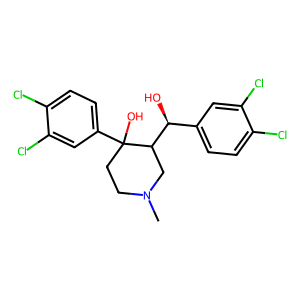

In [323]:
#Visualise each chemical compound

mol=Chem.MolFromSmiles(data_all["canonical_smiles"][4])
img = Draw.MolToImage(mol)
img

In [ ]:
#Toxicty prediction using pre trained model
#function for lipinski calculator from. : https://codeocean.com/explore/capsules?query=tag:data-curation


calc = Calculator(descriptors)

def toxicity(smiles, verbose=False):
    
    mol = calc.pandas([smiles]).iloc[0]

    # Use the model to predict the toxicity of the compound
    toxicity_prediction = model.predict([mol])[0]

    # Return the probability of the compound being toxic
    return toxicity_prediction
    


In [ ]:
df["toxicity_prediction"] = data["canonical_smiles"].apply(toxicity)

In [448]:
data_all.head(1)

,molecule_chembl_id,canonical_smiles,standard_type,standard_value,standard_units,MW,HeavyAtomMolWt,LogP,MolMR,NumHDonors,NumHAcceptors,NumAtoms,GetBonds,CFG,AR,TPSA,RB
0,CHEMBL1790051,COC(=O)[C@@H]1C2CC[C@H](C[C@@H]1c1ccccc1)N2C.Cl,Ki,33.0,nM,295.81,273.634,2.8477,81.127,0,3,20,<rdkit.Chem.rdchem._ROBondSeq object at 0x2abc...,(<rdkit.Chem.rdchem.Mol object at 0x2abcf3450>...,1,29.54,2


In [449]:
#Separate out standard types
data_ki = data_all[data_all["standard_type"]=="Ki"]
data_ic50 = data_all[data_all["standard_type"]=="IC50"]
data_inh = data_all[data_all["standard_type"]=="Inhibition"]
data_act = data_all[data_all["standard_type"]=="Activity"]

In [450]:
#Clean out all the standard_units
data_ki=data_ki[data_ki["standard_units"]=="nM"]
data_ic50=data_ic50[data_ic50["standard_units"]=="nM"]
data_inh=data_inh[data_inh["standard_units"]=="%"]
data_act=data_act[data_act["standard_units"]=="%"]

#Ki and IC50 are in nanomolar units and inhibition and activity are in % units

In [451]:
#Print the standrad units
print("ki units: ",data_ki["standard_units"].value_counts())
print("ic50 units: ",data_ic50["standard_units"].value_counts())
print("inh units: ",data_inh["standard_units"].value_counts())
print("act units: ",data_act["standard_units"].value_counts())


ki units:  nM    2193
Name: standard_units, dtype: int64
ic50 units:  nM    2466
Name: standard_units, dtype: int64
inh units:  %    1258
Name: standard_units, dtype: int64
act units:  %    128
Name: standard_units, dtype: int64


In [452]:
#Missing values in each activity class
print("missing in ki",data_ki.standard_value.isna().sum())
print("missing in ic50",data_ic50.standard_value.isna().sum())
print("missing in inh",data_inh.standard_value.isna().sum())
print("missing in act",data_act.standard_value.isna().sum())

missing in ki 3
missing in ic50 13
missing in inh 175
missing in act 0


<AxesSubplot: >

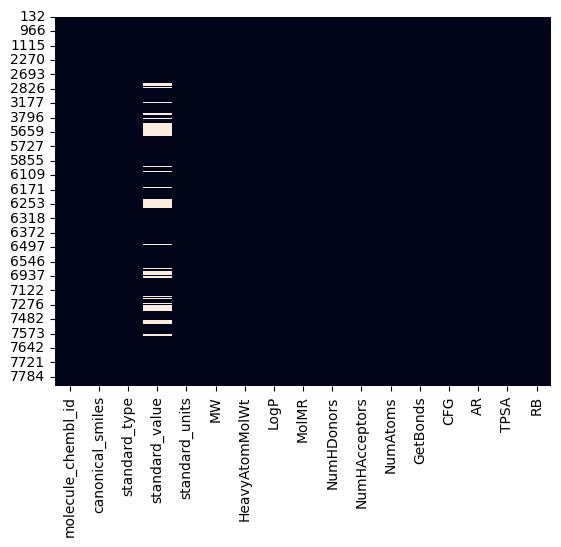

In [453]:
#Missing Data imputation

#Visualizing the missing valuees in data_inh
sns.heatmap(data_inh.isnull(), cbar=False)



<AxesSubplot: >

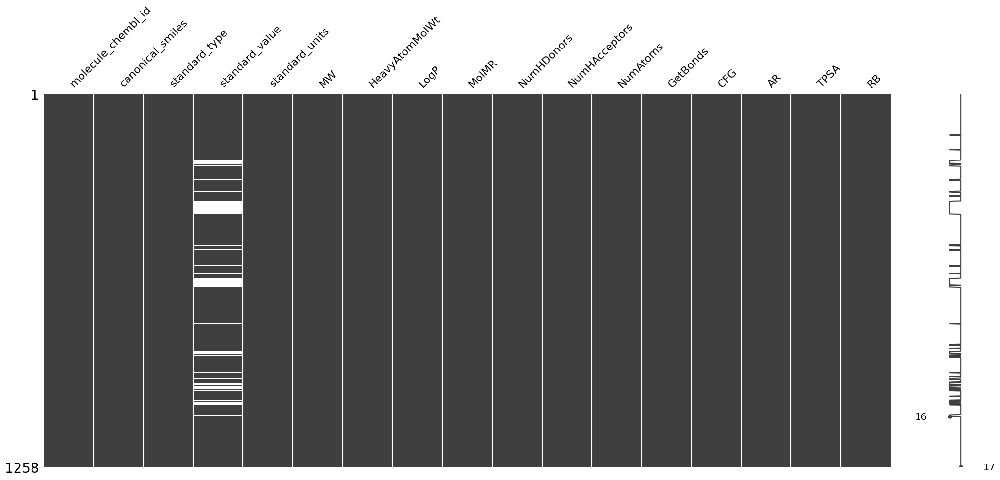

In [368]:
msno.matrix(data_inh)

In [454]:
#Null hypothesis - Missing values are MCAR
#Alternate hypthesis - Missing values are NOT MCAR

#Calculating chi-squared test statistic and p-value
chi2_stat = data_inh.isnull().sum().pipe(lambda x: ((x-x.mean())/x.std()).pow(2).sum())
p_val = chi2.sf(chi2_stat, data_inh.shape[1]-1)
if p_val < 0.05:
    print("The missing values are not MCAR")
else:
    print("The missing values are MCAR")
    

The missing values are MCAR


In [455]:
data_inh=data_inh[["standard_value","MW","HeavyAtomMolWt","LogP","MolMR","NumHDonors","NumHAcceptors","NumAtoms","AR","TPSA","RB"]]
data_inh=data_inh.reset_index(drop=True)
data_inh

,standard_value,MW,HeavyAtomMolWt,LogP,MolMR,NumHDonors,NumHAcceptors,NumAtoms,AR,TPSA,RB
0,5.0000,326.827,307.675,3.6959,93.277,0,3,23,2,24.83,3
1,5.7000,340.379,320.219,1.9816,93.6488,1,6,25,2,63.52,4
2,30.0000,332.79,319.686,4.4118,95.0178,1,3,24,4,38.05,1
3,12.0000,360.844,343.708,4.3094,103.1188,1,3,26,3,35.83,1
4,45.0000,346.817,331.697,4.4409,99.0748,1,3,25,3,35.83,1
5,5.0000,388.898,367.73,5.0736,112.8188,1,3,28,3,35.83,1
6,5.0000,384.866,367.73,4.9156,114.0148,1,3,28,4,35.83,1
7,35.0000,304.393,284.233,2.8346,90.6348,1,3,23,2,35.83,1
8,20.0000,400.481,380.321,5.4154,126.5108,1,3,31,5,35.83,1
9,-4.0000,620.81,571.418,6.0444,173.7508,1,7,45,3,80.06,13


In [398]:
max(data_inh["standard_value"])

105.0

In [456]:
#MICE ALGORITHM WITH K-FOLD CROSS VALIDATION
#Finding training and validation loss using MICE
mice_imputer=IterativeImputer()
n_folds = 5
#cross validation object
kf = KFold(n_splits=n_folds, shuffle=True)
#training error list
train_errors = np.zeros(n_folds)
#validation error list
val_errors = np.zeros(n_folds)

for i, (train_index, val_index) in enumerate(kf.split(data_inh)):
    # split data into training and validation sets
    train_df = data_inh.iloc[train_index]
    val_df = data_inh.iloc[val_index]

    # impute missing values using MICE on training set
    train_imputed_array = mice_imputer.fit_transform(train_df)
    train_imputed_df = pd.DataFrame(train_imputed_array, columns=train_df.columns)

    # calculate training error
    train_error = ((train_df - train_imputed_df) ** 2).mean().mean()
    train_errors[i] = train_error

    # impute missing values using MICE on validation set
    val_imputed_array = mice_imputer.transform(val_df)
    val_imputed_df = pd.DataFrame(val_imputed_array, columns=val_df.columns)

    # calculate validation error
    val_error = ((val_df - val_imputed_df) ** 2).mean().mean()
    val_errors[i] = val_error


print("Average training error:", train_errors.mean())
print("Average validation error:", val_errors.mean())

Average training error: 3763.450688178347
Average validation error: 3795.6952971032324


In [457]:
#MICE ALGORITHM - working
mice_imputer=IterativeImputer()
imputed_array = mice_imputer.fit_transform(data_inh)
imputed_df = pd.DataFrame(imputed_array, columns=data_inh.columns)

In [458]:
print("missing in inh",imputed_df.standard_value.isna().sum())

missing in inh 0


In [400]:
#MIDAS ALGORITHM USING AUTOENCODERS


In [459]:
#CONCATENATE ALL THE 4 DATA CLASSES
data_all = pd.concat([data_ki,data_ic50,imputed_df,data_act], axis=0)
data_all=data.reset_index(drop=True)
data_all.shape

(7819, 5)

In [411]:
#molecule_chembl_id - remove redundancy - ????
#data_all = data_all.drop_duplicates(['molecule_chembl_id'])
#data_all.molecule_chembl_id.value_counts()
#data_all.shape

In [460]:
#Checking range of values
#Ki is the binding affility of a compound to the dopamin receptor - strength of interaction
#Ki value represents the concentration of the ligand required to occupy 50% of the target protein binding sites. 
#Lowe Ki value indicates stronger binding affinity, higher Ki refers to weaker binding affinity
#Range: 0.12 to 912010839355911.6
print("Min Ki value",min(data_ki.standard_value))
print("Max Ki value",max(data_ki.standard_value))

#IC50 refers to the concentration of inhibitor required to reduce the enzymatic activity to half of the uninhibited 
#value. Lower the IC50, better the potency of the drug as we can use less concentration of this drug.
#Range: 0.002 to 744000
print("Min ic50 value",min(data_ic50.standard_value))
print("Max ic50 value",max(data_ic50.standard_value))

#Inhibition value indicates the compound's ability to bind to and block the activity of the target protein.
#Negative inhibition value indicates that, inversely it is stimulating the activity
#Higher the inhibition value, the better inhibition it provides
#Range: -63.9 to 105.0
print("Min inh value",min(imputed_df.standard_value))
print("Max inh value",max(imputed_df.standard_value))

#Activity is the quantitative endpoint of concentration of a compound required to achieve inhibition activity
#The higher the activity value, indicates a stronger biological activity
#Activity is from 0.0 to 10000
print("Min act value",min(data_act.standard_value))
print("Max act value",max(data_act.standard_value))

Min Ki value 0.12
Max Ki value 912010839355911.6
Min ic50 value 0.002
Max ic50 value 744000.0
Min inh value -63.9
Max inh value 105.0
Min act value 0.0
Max act value 10000.0


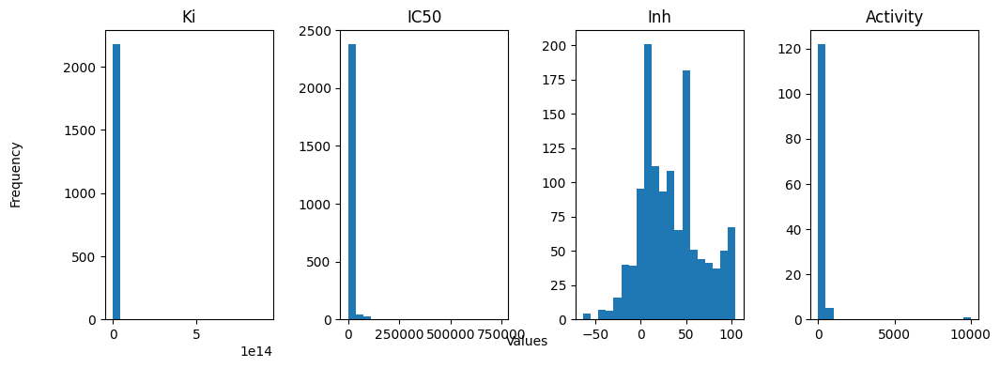

In [461]:
#Distribution of standard values in each class
fig, axs = plt.subplots(1, 4, figsize=(12, 4))
axs[0].hist(data_ki.standard_value, bins=20)
axs[1].hist(data_ic50.standard_value, bins=20)
axs[2].hist(imputed_df.standard_value, bins=20)
axs[3].hist(data_act.standard_value, bins=20)

axs[0].set_title('Ki')
axs[1].set_title('IC50')
axs[2].set_title('Inh')
axs[3].set_title('Activity')

fig.text(0.5, 0.04, 'Values', ha='center')
fig.text(0.04, 0.5, 'Frequency', va='center', rotation='vertical')

plt.subplots_adjust(wspace=0.4)

plt.show()

In [462]:
#SET THRESHOLDS FOR EACH CLASS AND CREATE COLUMN AS ACTIVE OR INACTIVE
#Ki
bioactivity_class = []
for i in data_ki.standard_value:
  if float(i) >= 10000:
    bioactivity_class.append("inactive")
  elif float(i) <= 1000:
    bioactivity_class.append("active")

bioactivity_class = pd.Series(bioactivity_class, name='bioactivity_class')
data_ki = pd.concat([data_ki, bioactivity_class], axis=1)

data_ki["bioactivity_class"].value_counts()

active      1354
inactive     302
Name: bioactivity_class, dtype: int64

In [464]:
#IC50
bioactivity_class = []
for i in data_ic50.standard_value:
  if float(i) >= 10000:
    bioactivity_class.append("inactive")
  elif float(i) <= 1000:
    bioactivity_class.append("active")

bioactivity_class = pd.Series(bioactivity_class, name='bioactivity_class')
data_ic50 = pd.concat([data_ic50, bioactivity_class], axis=1)
data_ic50["bioactivity_class"].value_counts()

active      1390
inactive     460
Name: bioactivity_class, dtype: int64

In [467]:
#Inhibition
bioactivity_class = []
for i in imputed_df.standard_value:
  if float(i) >= 50:
    bioactivity_class.append("inactive")
  elif float(i) <= 49:
    bioactivity_class.append("active")

bioactivity_class = pd.Series(bioactivity_class, name='bioactivity_class')
imputed_df = pd.concat([imputed_df, bioactivity_class], axis=1)
imputed_df["bioactivity_class"].value_counts()

active      808
inactive    450
Name: bioactivity_class, dtype: int64

In [470]:
#Activity
bioactivity_class = []
for i in data_act.standard_value:
  if float(i) >= 5000:
    bioactivity_class.append("inactive")
  elif float(i) <= 1000:
    bioactivity_class.append("active")

bioactivity_class = pd.Series(bioactivity_class, name='bioactivity_class')
data_act = pd.concat([data_act, bioactivity_class], axis=1)
data_act["bioactivity_class"].value_counts()

ValueError: Grouper for 'bioactivity_class' not 1-dimensional

In [ ]:
#Standardize all values


In [127]:
#FINGERPRINTS

def generate_fingerprint(smiles):

    mol = Chem.MolFromSmiles(smiles)
    fingerprint = AllChem.GetMorganFingerprintAsBitVect(mol, 2)
    fingerprint = list(fingerprint.ToBitString())
    return fingerprint



In [142]:

fingerprint = df_combined["canonical_smiles"].apply(generate_fingerprint)
fingerprint

2       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
5       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
6       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
13      [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...
                              ...                        
7495    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...
7496    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
7502    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
7842    [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
7844    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: canonical_smiles, Length: 6045, dtype: object

In [ ]:
#STATISTICAL TESTING FOR PARAMETRIC, NON PARAMETRIC


In [ ]:
#VISUALIZATION

In [412]:

data_all.groupby('standard_type').count()

,molecule_chembl_id,canonical_smiles,standard_value,standard_units
standard_type,,,,
Activity,186,186,133,133
IC50,3344,3344,2457,2470
Inhibition,1258,1258,1083,1258
Ki,3031,3031,2193,2196


In [413]:
data_all.standard_type.value_counts()

IC50          3344
Ki            3031
Inhibition    1258
Activity       186
Name: standard_type, dtype: int64

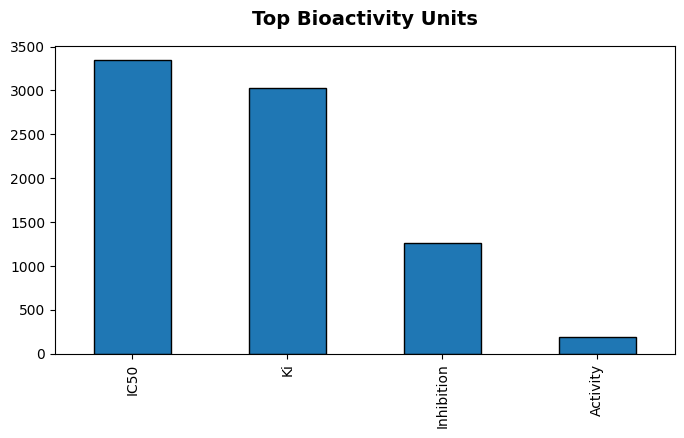

In [414]:
data_all.standard_type.value_counts()[:10].plot.bar(figsize=(8,4), ec='black')

plt.title('Top Bioactivity Units', fontsize=14, fontweight='black', pad=15)
plt.show()

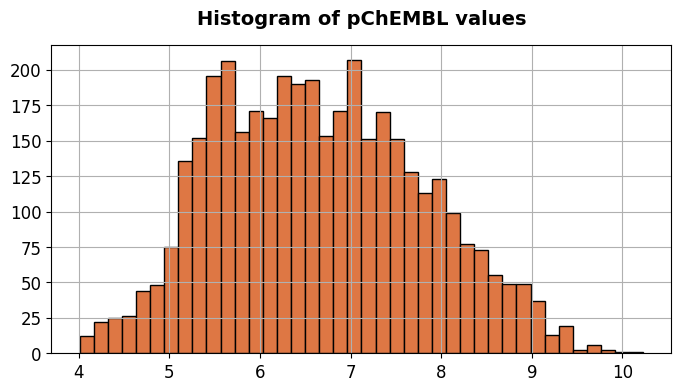

In [415]:
df.pchembl_value.hist(bins=40, figsize=(8,4), color='#de7744', ec='black')

plt.title('Histogram of pChEMBL values', fontsize=14, fontweight='black', pad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

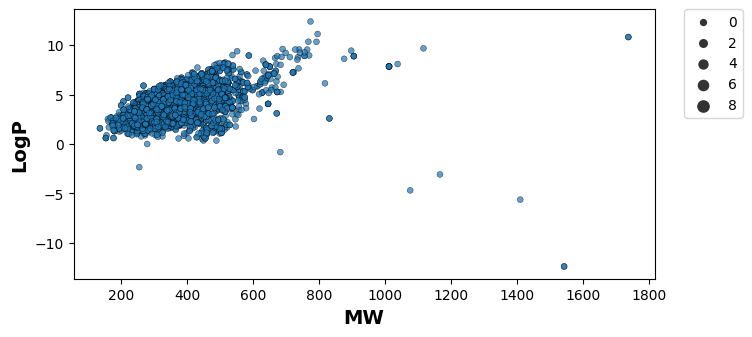

In [474]:
import seaborn as sns
plt.figure(figsize=(7.5, 3.5))

sns.scatterplot(x='MW', y='LogP', data=data_all,  size='standard_value', edgecolor='black', alpha=0.7)

plt.xlabel('MW', fontsize=14, fontweight='bold')
plt.ylabel('LogP', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
plt.savefig('plot_MW_vs_LogP.pdf')

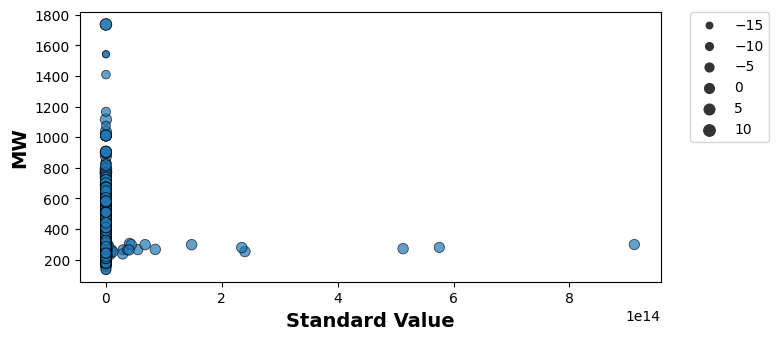

In [475]:
import seaborn as sns
plt.figure(figsize=(7.5, 3.5))

sns.scatterplot(x='standard_value', y='MW', data=data_all,  size='LogP', edgecolor='black', alpha=0.7)

plt.xlabel('Standard Value', fontsize=14, fontweight='bold')
plt.ylabel('MW', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
plt.savefig('plot_MW_vs_LogP.pdf')